In [ ]:
!cd 

In [17]:
import pandas as pd
org_housing = pd.read_csv("C:/Users/HL/Downloads/housing.csv")
housing = org_housing.copy()

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import numpy as np
from sklearn.model_selection import train_test_split

housing = org_housing.copy()
housing["income_cat"] = pd.cut(housing["median_income"], bins=[0, 1.5, 3.0, 4.5, 6, np.inf], labels=[1, 2, 3, 4, 5])

strat_train_set, strat_test_set = train_test_split(housing, test_size=0.20, stratify=housing["income_cat"], random_state=42)
for set_ in (strat_train_set, strat_test_set):
    set_.drop("income_cat", axis=1, inplace=True)
housing = strat_train_set.drop("median_house_value", axis=1)
housing_labels = strat_train_set["median_house_value"].copy()

In [2]:
# Simple Feature Engineering via attribute combinations
from ydata_profiling import ProfileReport

housing["rooms_per_house"] = housing["total_rooms"] / housing["households"]
housing["bedrooms_ratio"] = housing["total_bedrooms"] / housing["total_rooms"]
housing["people_per_house"] = housing["population"] / housing["households"]
profile = ProfileReport(housing, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Text(0.5, 1.0, 'Correlation Matrix Heatmap')

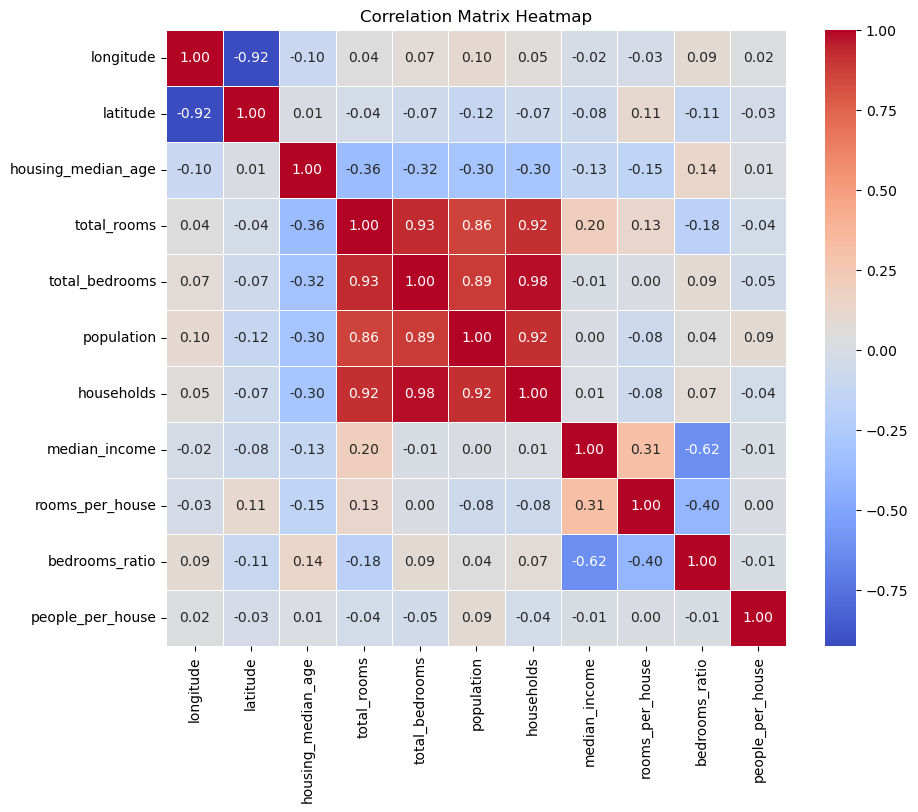

In [3]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

numerical_columns = housing.select_dtypes(include=['number'])

# Compute the correlation matrix for numerical columns
correlation_matrix = numerical_columns.corr()

plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")



In [19]:
# Data Preprocessing -- fix missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy="median")

# print(imputer)

housing_num = housing.select_dtypes(include=[np.number])
imputer.fit(housing_num)

housing_num.describe()

pd.DataFrame(imputer.transform(housing_num), columns=housing_num.columns).describe()

SimpleImputer(strategy='median')

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
count,16512.000000,16512.000000,16512.000000,16512.000000,16344.000000,16512.000000,16512.000000,16512.000000
mean,-119.573125,35.637746,28.577156,2639.402798,538.949094,1425.513929,499.990189,3.870428
std,2.000624,2.133294,12.585738,2185.287466,423.862079,1094.795467,382.865787,1.891936
min,-124.350000,32.550000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900
25%,-121.800000,33.930000,18.000000,1447.000000,296.000000,787.000000,279.000000,2.562500
50%,-118.510000,34.260000,29.000000,2125.000000,434.000000,1167.000000,408.000000,3.538500
75%,-118.010000,37.720000,37.000000,3154.000000,645.000000,1726.000000,603.000000,4.750000
max,-114.490000,41.950000,52.000000,39320.000000,6210.000000,16305.000000,5358.000000,15.000100


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
count,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000
mean,-119.573125,35.637746,28.577156,2639.402798,537.881298,1425.513929,499.990189,3.870428
std,2.000624,2.133294,12.585738,2185.287466,421.831667,1094.795467,382.865787,1.891936
min,-124.350000,32.550000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900
25%,-121.800000,33.930000,18.000000,1447.000000,297.000000,787.000000,279.000000,2.562500
50%,-118.510000,34.260000,29.000000,2125.000000,434.000000,1167.000000,408.000000,3.538500
75%,-118.010000,37.720000,37.000000,3154.000000,642.000000,1726.000000,603.000000,4.750000
max,-114.490000,41.950000,52.000000,39320.000000,6210.000000,16305.000000,5358.000000,15.000100


In [20]:
# Data Preprocessing -- Handle text attributes
from sklearn.preprocessing import OneHotEncoder

### one hot encoder can handle unknown values by ignoring them! Look up documentation

housing_cat = housing.select_dtypes(include=['object']) # PandasV2
cat_encoder = OneHotEncoder()
housing_cat_1hot = cat_encoder.fit_transform(housing_cat)
housing_cat_1hot.toarray()
cat_encoder.categories_

array([[0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1.]])

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

In [32]:
# Data Preprocessing -- Feature Scaling
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler(feature_range=(-1, 1))
housing_num_min_max_scaled = min_max_scaler.fit_transform(housing_num)

from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()
housing_num_std_scaled = std_scaler.fit_transform(housing_num)

In [33]:
# Data Preprocessing -- Custom Transformers

from sklearn.preprocessing import FunctionTransformer
log_transformer = FunctionTransformer(np.log, inverse_func=np.exp) # inverse_func option
log_transformer.transform(housing[["population"]])


,population
13096,7.362645
14973,6.501290
3785,6.331502
14689,7.520235
20507,7.555905
...,...
14207,6.843750
13105,7.257708
19301,7.942362
19121,7.452982


In [23]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_array, check_is_fitted
class StandardScalerClone(BaseEstimator, TransformerMixin):
    def __init__(self, with_mean=True):  # no *args or **kwargs!
        self.with_mean = with_mean

    def fit(self, X, y=None):  # y is required even though we don't use it
        X = check_array(X)  # checks that X is an array with finite float values
        self.mean_ = X.mean(axis=0)
        self.scale_ = X.std(axis=0)
        self.n_features_in_ = X.shape[1]  # every estimator stores this in fit()
        return self  # always return self!

    def transform(self, X):
        check_is_fitted(self)  # looks for learned attributes (with trailing _)
        X = check_array(X)
        assert self.n_features_in_ == X.shape[1]
        if self.with_mean:
            X = X - self.mean_
        return X / self.scale_


In [ ]:
from sklearn.cluster import KMeans
class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10,
                              random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self  # always return self!

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)

    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]



In [24]:
import numpy as np
from sklearn.datasets import make_blobs
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans

# Define the ClusterSimilarity class
class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10, random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self  # always return self!

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)

    def fit_transform(self, X, y=None, sample_weight=None):
        self.fit(X, y, sample_weight)
        return self.transform(X)

    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]

# Generate some sample data
X, y = make_blobs(n_samples=10, centers=3, n_features=2, random_state=42)

# Instantiate the ClusterSimilarity transformer
cluster_sim = ClusterSimilarity(n_clusters=3, gamma=0.5, random_state=42)

# Fit and transform the data
similarity_matrix = cluster_sim.fit_transform(X)

# Print the original data and the resulting similarity matrix
print("Original Data (X):")
print(X)
print("\nCluster Centers:")
print(cluster_sim.kmeans_.cluster_centers_)
print("\nSimilarity Matrix (fit_transform output):")
print(similarity_matrix)

d:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Original Data (X):
[[-5.41397842 -7.10588589]
 [-7.42400992 -6.769187  ]
 [ 3.62704772  2.28741702]
 [-6.81209899 -8.30485778]
 [-2.26723535  7.10100588]
 [-2.97867201  9.55684617]
 [-0.92998481  9.78172086]
 [ 2.914961    1.41088215]
 [ 3.73185476  0.56086598]
 [-2.97261532  8.54855637]]

Cluster Centers:
[[-6.55002911 -7.39331023]
 [-2.28712687  8.74703232]
 [ 3.42462116  1.41972172]]

Similarity Matrix (fit_transform output):
[[5.03278314e-01 2.01625537e-57 1.78942476e-33]
 [5.61756878e-01 9.79826866e-59 7.61772432e-41]
 [1.44263700e-43 2.20758932e-17 6.72377177e-01]
 [6.37755829e-01 2.59768844e-68 5.12843842e-44]
 [2.49800830e-50 2.57973257e-01 9.04006383e-15]
 [6.95471207e-66 5.67215161e-01 5.23079534e-24]
 [1.22170360e-71 2.33118709e-01 4.99726363e-20]
 [5.18478201e-37 2.73497668e-18 8.78169364e-01]
 [2.01903751e-37 3.81418698e-23 6.59671807e-01]
 [1.08267553e-58 7.75192762e-01 1.19631119e-20]]


Original Data (X):
[[-5.41397842 -7.10588589]
 [-7.42400992 -6.769187  ]
 [ 3.62704772  2.28741702]
 [-6.81209899 -8.30485778]
 [-2.26723535  7.10100588]
 [-2.97867201  9.55684617]
 [-0.92998481  9.78172086]
 [ 2.914961    1.41088215]
 [ 3.73185476  0.56086598]
 [-2.97261532  8.54855637]]

Cluster Centers:
[[-6.55002911 -7.39331023]
 [-2.28712687  8.74703232]
 [ 3.42462116  1.41972172]]

Similarity Matrix (fit_transform output):
[[5.03278314e-01 2.01625537e-57 1.78942476e-33]
 [5.61756878e-01 9.79826866e-59 7.61772432e-41]
 [1.44263700e-43 2.20758932e-17 6.72377177e-01]
 [6.37755829e-01 2.59768844e-68 5.12843842e-44]
 [2.49800830e-50 2.57973257e-01 9.04006383e-15]
 [6.95471207e-66 5.67215161e-01 5.23079534e-24]
 [1.22170360e-71 2.33118709e-01 4.99726363e-20]
 [5.18478201e-37 2.73497668e-18 8.78169364e-01]
 [2.01903751e-37 3.81418698e-23 6.59671807e-01]
 [1.08267553e-58 7.75192762e-01 1.19631119e-20]]


<Axes: xlabel='Longitude', ylabel='Latitude'>

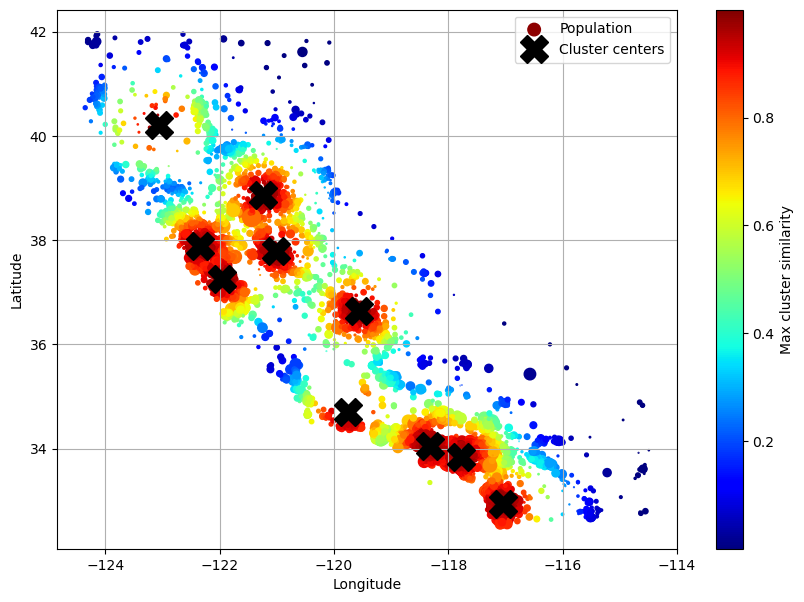

In [25]:
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
similarities = cluster_simil.fit_transform(housing[["latitude", "longitude"]],
                                           sample_weight=housing_labels)

housing_renamed = housing.rename(columns={
    "latitude": "Latitude", "longitude": "Longitude",
    "population": "Population",
    "median_house_value": "Median house value (ᴜsᴅ)"})
housing_renamed["Max cluster similarity"] = similarities.max(axis=1)

housing_renamed.plot(kind="scatter", x="Longitude", y="Latitude", grid=True,
                     s=housing_renamed["Population"] / 100, label="Population",
                     c="Max cluster similarity",
                     cmap="jet", colorbar=True,
                     legend=True, sharex=False, figsize=(10, 7))
plt.plot(cluster_simil.kmeans_.cluster_centers_[:, 1],
         cluster_simil.kmeans_.cluster_centers_[:, 0],
         linestyle="", color="black", marker="X", markersize=20,
         label="Cluster centers")
plt.legend(loc="upper right")
plt.show()


In [31]:
similarities[1,:]

array([5.82488504e-14, 9.90046143e-01, 1.62296800e-10, 3.84360842e-02,
       4.56888397e-04, 1.31326258e-13, 1.10891612e-01, 2.99695991e-26,
       6.32121447e-01, 1.49980122e-09])

In [36]:
from sklearn.pipeline import Pipeline, make_pipeline

num_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("standardize", StandardScaler()),
])

num_pipeline
num_pipeline.named_steps


x = pd.DataFrame(num_pipeline.fit_transform(housing_num), columns=num_pipeline.get_feature_names_out())
x["total_bedrooms"].isnull().sum()

Pipeline(steps=[('impute', SimpleImputer(strategy='median')),
                ('standardize', StandardScaler())])

{'impute': SimpleImputer(strategy='median'), 'standardize': StandardScaler()}

0

In [37]:
num_pipeline = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())
from sklearn import set_config

num_pipeline
num_pipeline.named_steps

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='median')),
                ('standardscaler', StandardScaler())])

{'simpleimputer': SimpleImputer(strategy='median'),
 'standardscaler': StandardScaler()}

In [38]:
# Explicit
from sklearn.compose import ColumnTransformer

num_attribs = ["longitude", "latitude", "housing_median_age", "total_rooms",
               "total_bedrooms", "population", "households", "median_income"]
cat_attribs = ["ocean_proximity"]

num_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    StandardScaler())

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))

preprocessing = ColumnTransformer([
    ("num", num_pipeline, num_attribs),
    ("cat", cat_pipeline, cat_attribs),
])

In [ ]:
# from sklearn.compose import make_column_selector, make_column_transformer


# num_pipeline = make_pipeline(
#     SimpleImputer(strategy="median"),
#     StandardScaler())

# cat_pipeline = make_pipeline(
#     SimpleImputer(strategy="most_frequent"),
#     OneHotEncoder(handle_unknown="ignore"))

# preprocessing = make_column_transformer(
#     (num_pipeline, make_column_selector(dtype_include=np.number)),
#     (cat_pipeline, make_column_selector(dtype_include=object)),
# )


In [39]:
housing_prepared = preprocessing.fit_transform(housing)
housing_prepared_fr = pd.DataFrame(
    housing_prepared,
    columns=preprocessing.get_feature_names_out(),
    index=housing.index)
housing_prepared_fr.head(2)


,num__longitude,num__latitude,num__housing_median_age,num__total_rooms,num__total_bedrooms,num__population,num__households,num__median_income,cat__ocean_proximity_<1H OCEAN,cat__ocean_proximity_INLAND,cat__ocean_proximity_ISLAND,cat__ocean_proximity_NEAR BAY,cat__ocean_proximity_NEAR OCEAN
13096,-1.423037,1.013606,1.861119,0.311912,1.368167,0.137460,1.394812,-0.936491,0.0,0.0,0.0,1.0,0.0
14973,0.596394,-0.702103,0.907630,-0.308620,-0.435925,-0.693771,-0.373485,1.171942,1.0,0.0,0.0,0.0,0.0


In [43]:
from sklearn.compose import make_column_selector, make_column_transformer

def column_ratio(X):
    return X[:, [0]] / X[:, [1]]

def ratio_name(function_transformer, feature_names_in):
    return ["ratio"]  # feature names out

def ratio_pipeline():
    return make_pipeline(
        SimpleImputer(strategy="median"),
        FunctionTransformer(column_ratio, feature_names_out=ratio_name),
        StandardScaler())

log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    FunctionTransformer(np.log, feature_names_out="one-to-one"),
    StandardScaler())

cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())
preprocessing = ColumnTransformer([
        ("bedrooms", ratio_pipeline(), ["total_bedrooms", "total_rooms"]),
        ("rooms_per_house", ratio_pipeline(), ["total_rooms", "households"]),
        ("people_per_house", ratio_pipeline(), ["population", "households"]),
        ("log", log_pipeline, ["total_bedrooms", "total_rooms", "population",
                               "households", "median_income"]),
        ("geo", cluster_simil, ["latitude", "longitude"]),
        ("cat", cat_pipeline, make_column_selector(dtype_include=object)),
    ],
    remainder=default_num_pipeline)  # one column remaining: housing_median_age


In [45]:
ratio_pipeline().fit_transform(housing[["total_rooms","households"]])

array([[-0.86602737],
       [ 0.0245495 ],
       [-0.04119332],
       ...,
       [-0.10998748],
       [-0.36093745],
       [-1.32397227]])

In [47]:
housing_prepared = preprocessing.fit_transform(housing)
housing_prepared.shape

(16512, 24)

In [48]:
preprocessing.get_feature_names_out()

array(['bedrooms__ratio', 'rooms_per_house__ratio',
       'people_per_house__ratio', 'log__total_bedrooms',
       'log__total_rooms', 'log__population', 'log__households',
       'log__median_income', 'geo__Cluster 0 similarity',
       'geo__Cluster 1 similarity', 'geo__Cluster 2 similarity',
       'geo__Cluster 3 similarity', 'geo__Cluster 4 similarity',
       'geo__Cluster 5 similarity', 'geo__Cluster 6 similarity',
       'geo__Cluster 7 similarity', 'geo__Cluster 8 similarity',
       'geo__Cluster 9 similarity', 'cat__ocean_proximity_<1H OCEAN',
       'cat__ocean_proximity_INLAND', 'cat__ocean_proximity_ISLAND',
       'cat__ocean_proximity_NEAR BAY', 'cat__ocean_proximity_NEAR OCEAN',
       'remainder__housing_median_age'], dtype=object)

In [51]:
from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(housing, housing_labels)
housing_predictions = lin_reg.predict(housing)
housing_predictions[:5].round(-2)
housing_labels.iloc[:5].values

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('bedrooms',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_name at 0x000...
                                                   'median_income']),
                                                 ('geo',
                                                  ClusterSimilarity(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000244CA9B80E0>)])),
                ('linearregression', LinearRegression())])

array([242800., 375900., 127500.,  99400., 324600.])

array([458300., 483800., 101700.,  96100., 361800.])

In [54]:
# lin_reg.get_params()
error_ratios = housing_predictions[:5].round(-2) / housing_labels.iloc[:5].values - 1
print(", ".join([f"{100 * ratio:.1f}%" for ratio in error_ratios]))

-47.0%, -22.3%, 25.4%, 3.4%, -10.3%


In [55]:
from sklearn.metrics import root_mean_squared_error
lin_rmse = root_mean_squared_error(housing_labels, housing_predictions)
lin_rmse


68647.95686706711

In [57]:
lin_reg.get_params()

{'memory': None,
 'steps': [('columntransformer',
   ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                SimpleImputer(strategy='median')),
                                               ('standardscaler',
                                                StandardScaler())]),
                     transformers=[('bedrooms',
                                    Pipeline(steps=[('simpleimputer',
                                                     SimpleImputer(strategy='median')),
                                                    ('functiontransformer',
                                                     FunctionTransformer(feature_names_out=<function ratio_name at 0x00000244C9C38D60>,
                                                                         func=<function column_r...
                                    ['total_bedrooms', 'total_rooms', 'population',
                                     'households', 'median_income

In [58]:
import os

MLFLOW_TRACKING_URI="https://dagshub.com/habib_lotfi/fall2024_housing_model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME']='habib_lotfi'
os.environ['MLFLOW_TRACKING_PASSWORD']='2ec1b86244c690278153204252d33f06e5ed1a0e'


import mlflow
from mlflow.models import infer_signature

# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Create a new MLflow Experiment
mlflow.set_experiment("fall24_house_pricing")

score = lin_rmse
params = {"test": 1}
with mlflow.start_run():
      # Log the hyperparameters
      mlflow.log_params(params)

      # Log metrics
      mlflow.log_metric("RMSE", score)
      # Infer the model signature
      signature = infer_signature(housing, lin_reg.predict(housing))

      # Log the model
      model_info = mlflow.sklearn.log_model(
          sk_model=lin_reg,
          artifact_path="housing_model",
          signature=signature,
          input_example=housing,
          registered_model_name="LinearRegression",
      )


<Experiment: artifact_location='mlflow-artifacts:/4b18ebe6837f4c0ebd49c785c9053deb', creation_time=1734580783148, experiment_id='0', last_update_time=1734580783148, lifecycle_stage='active', name='fall24_house_pricing', tags={}>

Registered model 'LinearRegression' already exists. Creating a new version of this model...
2025/01/11 00:36:00 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LinearRegression, version 7
Created version '7' of model 'LinearRegression'.


🏃 View run rogue-mare-624 at: https://dagshub.com/habib_lotfi/fall2024_housing_model.mlflow/#/experiments/0/runs/f4ec61b6823344c39a581f89cba64d3b
🧪 View experiment at: https://dagshub.com/habib_lotfi/fall2024_housing_model.mlflow/#/experiments/0


In [59]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor(random_state=42))
tree_reg.fit(housing, housing_labels)
housing_predictions = tree_reg.predict(housing)
tree_rmse = root_mean_squared_error(housing_labels, housing_predictions)
tree_rmse

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('bedrooms',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_name at 0x000...
                                                  ClusterSimilarity(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000244CA9B80E0>)])),
                ('decisiontreeregressor',
                 DecisionTreeRegressor(random_state=42))])

0.0

In [60]:
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(tree_reg, housing, housing_labels,
                              scoring="neg_root_mean_squared_error", cv=10)


In [63]:
tree_rmses.mean()
pd.Series(tree_rmses).describe()


67153.31827313449

count       10.000000
mean     67153.318273
std       1963.580924
min      63925.253106
25%      66083.277180
50%      66795.829871
75%      68074.018403
max      70664.635833
dtype: float64

In [65]:
tree_reg[1].get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': 42,
 'splitter': 'best'}

In [66]:
import os

MLFLOW_TRACKING_URI="https://dagshub.com/habib_lotfi/fall2024_housing_model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME']='habib_lotfi'
os.environ['MLFLOW_TRACKING_PASSWORD']='2ec1b86244c690278153204252d33f06e5ed1a0e'


import mlflow
from mlflow.models import infer_signature

# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Create a new MLflow Experiment
mlflow.set_experiment("fall24_house_pricing")

score = tree_rmses.mean()
params = tree_reg[1].get_params()
with mlflow.start_run():
      # Log the hyperparameters
      mlflow.log_params(params)

      # Log metrics
      mlflow.log_metric("RMSE", score)
      # Infer the model signature
      signature = infer_signature(housing, tree_reg.predict(housing))

      # Log the model
      model_info = mlflow.sklearn.log_model(
          sk_model=tree_reg,
          artifact_path="housing_model",
          signature=signature,
          input_example=housing,
          registered_model_name="DecisionTreeRegressor",
      )

<Experiment: artifact_location='mlflow-artifacts:/4b18ebe6837f4c0ebd49c785c9053deb', creation_time=1734580783148, experiment_id='0', last_update_time=1734580783148, lifecycle_stage='active', name='fall24_house_pricing', tags={}>

Registered model 'DecisionTreeRegressor' already exists. Creating a new version of this model...
2025/01/11 00:45:52 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: DecisionTreeRegressor, version 7
Created version '7' of model 'DecisionTreeRegressor'.


🏃 View run calm-fly-749 at: https://dagshub.com/habib_lotfi/fall2024_housing_model.mlflow/#/experiments/0/runs/593b6257625b47cab2d193a934395e8b
🧪 View experiment at: https://dagshub.com/habib_lotfi/fall2024_housing_model.mlflow/#/experiments/0


In [64]:
lin_rmses = -cross_val_score(lin_reg, housing, housing_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()


count       10.000000
mean     69847.923224
std       4078.407329
min      65659.761079
25%      68088.799156
50%      68697.591463
75%      69800.966364
max      80685.254832
dtype: float64

In [68]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing,
                           RandomForestRegressor(random_state=42))
forest_rmses = -cross_val_score(forest_reg, housing, housing_labels,
                                scoring="neg_root_mean_squared_error", cv=10)
pd.Series(forest_rmses).describe()

count       10.000000
mean     47002.931706
std       1048.451340
min      45667.064036
25%      46494.358345
50%      47093.173938
75%      47274.873814
max      49354.705514
dtype: float64

In [69]:
forest_reg.fit(housing, housing_labels)
housing_predictions = forest_reg.predict(housing)
forest_rmse = root_mean_squared_error(housing_labels, housing_predictions)
forest_rmse

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('bedrooms',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_name at 0x000...
                                                  ClusterSimilarity(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000244CA9B80E0>)])),
                ('randomforestregressor',
                 RandomForestRegressor(random_state=42))])

17547.52124624957

In [70]:
# Fine Tune the Model
from sklearn.model_selection import GridSearchCV

full_pipeline = Pipeline([
    ("preprocessing", preprocessing),
    ("random_forest", RandomForestRegressor(random_state=42)),
])
param_grid = [
    {'preprocessing__geo__n_clusters': [5, 8, 10],
     'random_forest__max_features': [4, 6, 8]},
    {'preprocessing__geo__n_clusters': [10, 15],
     'random_forest__max_features': [6, 8, 10]},
]
grid_search = GridSearchCV(full_pipeline, param_grid, cv=3,
                           scoring='neg_root_mean_squared_error')
grid_search.fit(housing, housing_labels)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                                                     SimpleImputer(strategy='median')),
                                                                                    ('standardscaler',
                                                                                     StandardScaler())]),
                                                          transformers=[('bedrooms',
                                                                         Pipeline(steps=[('simpleimputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('functiontransformer',
                                                                                          FunctionTransformer(feature_names_out=<f...
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x00000244CA9B80E0>)])),
                                       ('random_forest',
                                        RandomForestRegressor(random_state=42))]),
             param_grid=[{'preprocessing__geo__n_clusters': [5, 8, 10],
                          'random_forest__max_features': [4, 6, 8]},
                         {'preprocessing__geo__n_clusters': [10, 15],
                          'random_forest__max_features': [6, 8, 10]}],
             scoring='neg_root_mean_squared_error')

In [71]:
grid_search.best_params_


{'preprocessing__geo__n_clusters': 15, 'random_forest__max_features': 6}

In [72]:
-grid_search.best_score_

43952.588192716525

In [73]:
cv_res = pd.DataFrame(grid_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)

# extra code – these few lines of code just make the DataFrame look nicer
cv_res = cv_res[["param_preprocessing__geo__n_clusters",
                 "param_random_forest__max_features", "split0_test_score",
                 "split1_test_score", "split2_test_score", "mean_test_score"]]
score_cols = ["split0", "split1", "split2", "mean_test_rmse"]
cv_res.columns = ["n_clusters", "max_features"] + score_cols
cv_res[score_cols] = -cv_res[score_cols].round().astype(np.int64)

cv_res.head()

,n_clusters,max_features,split0,split1,split2,mean_test_rmse
12,15,6,43536,43753,44569,43953
13,15,8,44084,44205,44863,44384
14,15,10,44368,44496,45200,44688
7,10,6,44251,44628,45857,44912
9,10,6,44251,44628,45857,44912


In [89]:
import pandas as pd
import joblib

model = grid_search.best_estimator_
# Save the model
joblib.dump(model, 'random_forest_model_v1.pkl')
model = grid_search.best_estimator_
root_mean_squared_error(housing_labels, model.predict(housing))
test = strat_test_set.drop("median_house_value", axis=1)
test_labels = strat_test_set["median_house_value"].copy()
root_mean_squared_error(test_labels, model.predict(test))


['random_forest_model_v1.pkl']

16012.022381795468

43426.577409177575

In [90]:
final_model_reloaded = joblib.load("random_forest_model_v1.pkl")
root_mean_squared_error(housing_labels, final_model_reloaded.predict(housing))

16012.022381795468

In [59]:
!pip install requests

In [57]:
!pip install dill

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 4.1 MB/s eta 0:00:00


In [58]:
import dill
with open('final_model.pkl', 'wb') as f:
    dill.dump(final_model, f)